
# Lab 4: FDM-diffusion

 **Exercise** : Heat diffusion in a plate using FDM

Let's consider a rectangular heat-conducting plate with sides of lengths $a=20$ mm and $b=10$ mm. It has borders a temperature as is shown in figure.  The flat faces are isolated, so they can't lose head to the surroundings. The material is aluminum with thermal diffusivity $D\approx 84\, mm^2/s$.

<img src="https://github.com/anferivera/Fisica_Computacional_1/raw/main/Sesiones/PDE/figures/plato_coductor2.jpg" alt="Texto alternativo" width="400" height="400">

1. Use **FDM** to solve the *static solution* for this system for $f(x)=100\,\sin(3\pi x/a)$ C.
2. Compare the *static solution* with the analytical one.
2. Use **FDM** to found the temperature, i.e., solve the diffusion equation for some times.
3. Do a gif for the temperature in time (bonus!)

1. Use FDM to solve the static solution for this system for  f(x)=100sin(3πx/a)  C.

Se logra apreciar en la grafica que gracias a que las paredes estan constantemente en temperatura 0, el calor generado por el lateral superior se dispersa y se concentra su mayor temperatura en los valores maximos de la funcion sen(). ( np.zeros ).

Y la función sen() en los laterales tambien es 0, asi que la temperatura no es constante en toda la barra.

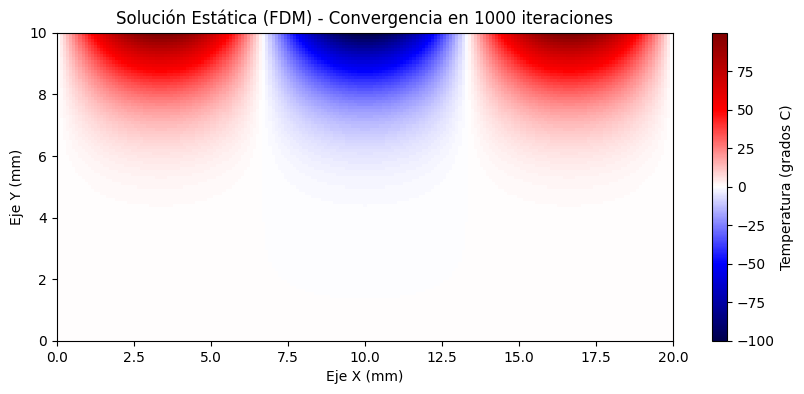

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parametros
a = 20.0  # ancho
b = 10.0  # altura
# Tamaño del diferencial y puntos en la malla
dx = dy = 0.1
nx, ny = int(a/dx) + 1, int(b/dy) + 1  #El +1 es para incluir bordes

# Difusion termica del aluminio
D = 84.0

# Inicialización de la placa y Condiciones de frontera
u = np.zeros((nx, ny))

x = np.linspace(0, a, nx)

# Temperatura en el borde superior T = f(x)
u[:, -1] = 100 * np.sin(3 * np.pi * x / a)
# Los bordes u[:, 0], u[0, :], y u[-1, :] se mantienen en 0.

# Condiciones para jaocbi

tolerancia = 1e-4
error = 1
iteraciones = 0
max_iter = 1000

# Solucion iterativa
while error > tolerancia and iteraciones < max_iter:
  u_old = u.copy()

  # Slicing: cálculo simultáneo del promedio para todos los nodos internos
  u[1:-1, 1:-1] = 0.25 * (
      u_old[2:, 1:-1] +   # Nodo derecho
      u_old[:-2, 1:-1] +  # Nodo izquierdo
      u_old[1:-1, 2:] +   # Nodo superior
      u_old[1:-1, :-2]    # Nodo inferior
    )
  # Medición de convergencia
  error = np.max(np.abs(u - u_old))
  iteraciones += 1

# Visualización del mapa de calor
plt.figure(figsize=(10, 4))
# Trasponer u(x,y) a u(y,x) para que imshow alinee correctamente los ejes espaciales
im = plt.imshow(u.T, cmap="seismic", origin='lower', extent=[0, a, 0, b])
plt.colorbar(im, label="Temperatura (grados C)")
plt.title(f"Solución Estática (FDM) - Convergencia en {iteraciones} iteraciones")
plt.xlabel("Eje X (mm)")
plt.ylabel("Eje Y (mm)")
plt.show()





2. Compare the static solution with the analytical one.

Se ve que son bastante parecidas, aunque en el eje Y siempre la solucion analitica llega a mostrar mayor permeabilidad de calor en los 3 ejes principales que marcan la temperatura. Ademas de ser mucho mas facil de conseguir.

Error absoluto máximo en la malla: 1.148038e+01


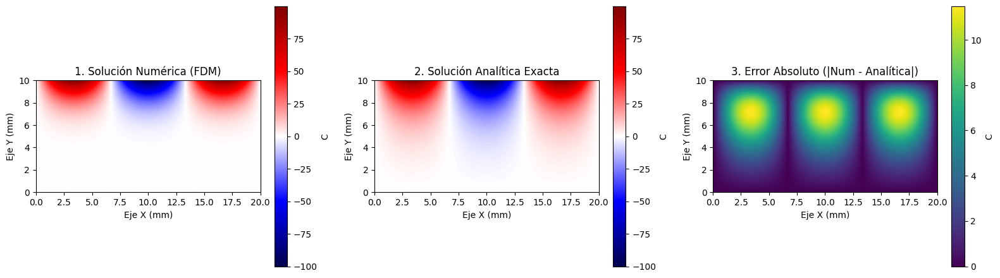

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Crear la malla espacial en 2D con coordenadas X e Y reales
x = np.linspace(0, a, nx)
y = np.linspace(0, b, ny)
X, Y = np.meshgrid(x, y, indexing='ij') # indexing='ij' empareja con la estructura u[x, y]

# Evaluar la solución analítica Exacta
# T(x,y) = 100 * sin(3*pi*x/a) * sinh(3*pi*y/a) / sinh(3*pi*b/a)
termino_x = 3 * np.pi * X / a
termino_y = 3 * np.pi * Y / a
denominador_constante = np.sinh(3 * np.pi * b / a)

T_analitica = 100 * np.sin(termino_x) * np.sinh(termino_y) / denominador_constante

# Calcular el error absoluto entre el método numérico (FDM) y el analítico
error_absoluto = np.abs(u - T_analitica)
print(f"Error absoluto máximo en la malla: {np.max(error_absoluto):.6e}")

# Visualización comparativa de los 3 paneles que quiero mostrar
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))

# Gráfica 1: Numérica (FDM)
im0 = axes[0].imshow(u.T, cmap="seismic", origin='lower', extent=[0, a, 0, b])
axes[0].set_title("1. Solución Numérica (FDM)")
fig.colorbar(im0, ax=axes[0], label="C")

# Gráfica 2: Analítica
im1 = axes[1].imshow(T_analitica.T, cmap="seismic", origin='lower', extent=[0, a, 0, b])
axes[1].set_title("2. Solución Analítica Exacta")
fig.colorbar(im1, ax=axes[1], label="C")

# Gráfica 3: El Error
im2 = axes[2].imshow(error_absoluto.T, cmap="viridis", origin='lower', extent=[0, a, 0, b])
axes[2].set_title("3. Error Absoluto (|Num - Analítica|)")
fig.colorbar(im2, ax=axes[2], label="C")

for ax in axes:
    ax.set_xlabel("Eje X (mm)")
    ax.set_ylabel("Eje Y (mm)")

plt.tight_layout()
plt.show()

3. Use FDM to found the temperature, i.e., solve the diffusion equation for some times.

Se logra apreciar el aumento de temperatura por la difusion, siempre manteniendo constante el hecho de que en el lateral no se alcanza a aumentar la temperatura por el factor sen(0) y sen(3π).

Paso de tiempo (dt) = 0.000030 segundos
Tiempo de CPU (s) = 77.4929


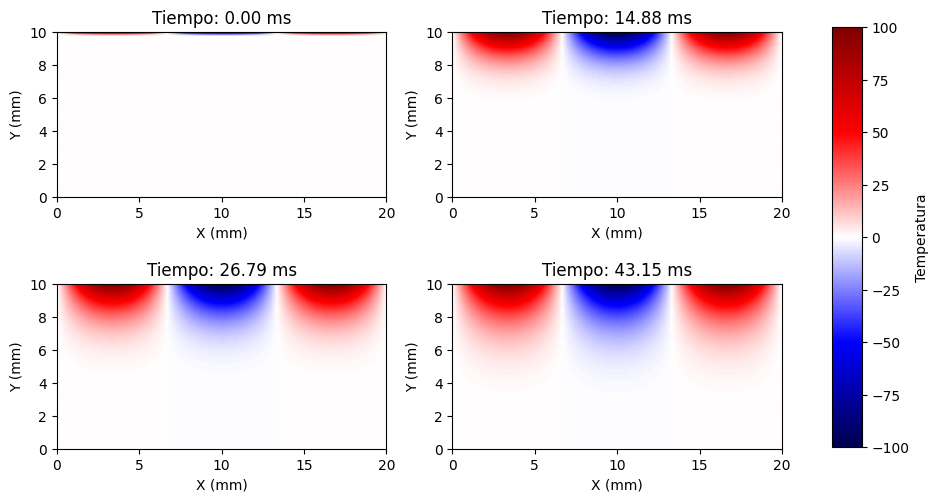

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time as tm

# Parámetros geométricos y del material
a, b = 20.0, 10.0
dx = dy = 0.1
dx2, dy2 = dx**2, dy**2
D = 84.0  # Difusividad térmica del aluminio

nx, ny = int(a/dx) + 1, int(b/dy) + 1

# Paso de tiempo seguro
dt = dx2 * dy2 / (2 * D * (dx2 + dy2))
print(f"Paso de tiempo (dt) = {dt:.6f} segundos")

# Condiciones Iniciales: Toda la placa interior a 0 grados
u0 = np.zeros((nx, ny))

# Vector coordenado X para la frontera
x = np.linspace(0, a, nx)

# Condición de frontera permanente en el borde superior (y = b, índice -1)
u0[:, -1] = 100 * np.sin(3 * np.pi * x / a)
u = u0.copy()

# Función de difusión estilo clase adaptada al rectángulo con frontera fija
def Diffusion2D_Rect(V_ini, nx, ny, dt, D):
    u = V_ini.copy()
    for i in range(1, nx - 1):
        for j in range(1, ny - 1):
            uxx = (V_ini[i+1, j] - 2*V_ini[i, j] + V_ini[i-1, j]) / dx2
            uyy = (V_ini[i, j+1] - 2*V_ini[i, j] + V_ini[i, j-1]) / dy2
            u[i, j] = V_ini[i, j] + dt * D * (uxx + uyy)

    # Forzar la condición de frontera superior constante en cada paso temporal
    u[:, -1] = 100 * np.sin(3 * np.pi * x / a)
    return u

# Configuración de la simulación temporal y visualización de los paneles
nsteps = 1500            # Número total de pasos temporales a simular
mfig = [0, 500, 900, 1450]  # Instantes exactos donde tomaremos una imagen
fignum = 0

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 6))
start = tm.process_time()

for m in range(nsteps):
    u = Diffusion2D_Rect(u0, nx, ny, dt, D)
    u0 = u.copy()

    if m in mfig:
        ax = axes[fignum // 2, fignum % 2]
        im = ax.imshow(u.T, cmap="seismic", origin='lower', extent=[0, a, 0, b], vmin=-100, vmax=100)
        ax.set_title(f"Tiempo: {m * dt * 1000:.2f} ms")
        ax.set_xlabel("X (mm)")
        ax.set_ylabel("Y (mm)")
        fignum += 1

end = tm.process_time()
print(f'Tiempo de CPU (s) = {end - start:.4f}')

fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([0.9, 0.15, 0.03, 0.7])
fig.colorbar(im, cax=cbar_ax, label="Temperatura")
plt.show()

4. Un GIF que permite visualizar el paso del tiempo de la placa.

Esta vez use magma para simular mas una placa caliente en la vida real.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Parámetros de forma y material
a, b = 20.0, 10.0
dx = dy = 0.1
dx2, dy2 = dx**2, dy**2
D = 84.0  # Difusividad térmica del aluminio

nx, ny = int(a/dx) + 1, int(b/dy) + 1

# Paso de tiempo
dt = dx2 * dy2 / (2 * D * (dx2 + dy2))

# Condiciones iniciales
u0 = np.zeros((nx, ny))
x = np.linspace(0, a, nx)
u0[:, -1] = 100 * np.sin(3 * np.pi * x / a)
u = u0.copy()

# Función de Difusion pero sin borrar la frontera
def Diffusion2D_Rect(V_ini, nx, ny, dt, D):
    u = V_ini.copy()
    for i in range(1, nx - 1):
        for j in range(1, ny - 1):
            uxx = (V_ini[i+1, j] - 2*V_ini[i, j] + V_ini[i-1, j]) / dx2
            uyy = (V_ini[i, j+1] - 2*V_ini[i, j] + V_ini[i, j-1]) / dy2
            u[i, j] = V_ini[i, j] + dt * D * (uxx + uyy)
    u[:, -1] = 100 * np.sin(3 * np.pi * x / a)
    return u

# Se crean y guardan los frames con los que luego se formara el GIF
# Se usaran 5000 pasos pero se usara uno cada 50 como intervalo, asi sera fluido pero no sobrecargado
nsteps_total = 5000
intervalo_guardado = 50
frames_animacion = []

print("Espera a que se cree el GIF")
for m in range(nsteps_total):
    u = Diffusion2D_Rect(u0, nx, ny, dt, D)
    u0 = u.copy()

    if m % intervalo_guardado == 0:
        frames_animacion.append(u.copy())

print(f"Total de fotogramas guardados para el GIF: {len(frames_animacion)}")

# Creacion de la imagen del GIF con los frames almacenados
fig, ax = plt.subplots(figsize=(8, 4))
im = ax.imshow(frames_animacion[0].T, cmap="magma", origin='lower', extent=[0, a, 0, b], vmin=-100, vmax=100)
fig.colorbar(im, label="Temperatura (C)")
ax.set_xlabel("Eje X (mm)")
ax.set_ylabel("Eje Y (mm)")
titulo = ax.set_title("")

def actualizar(i):
    im.set_array(frames_animacion[i].T)
    tiempo_ms = i * intervalo_guardado * dt * 1000
    titulo.set_text(f"Difusión de Calor en Aluminio - Tiempo: {tiempo_ms:.1f} ms")
    return [im, titulo]

ani = FuncAnimation(fig, actualizar, frames=len(frames_animacion), interval=50, blit=True)
plt.close() # Evita que se dibuje una figura extra al final

# Muestra el GIF
HTML(ani.to_jshtml())

Espera a que se cree el GIF
Total de fotogramas guardados para el GIF: 100
